In [172]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

import plotly.express as px 
import plotly.graph_objs as go

#from wwo_hist import retrieve_hist_data
import os
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.naive_bayes import GaussianNB

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import GridSearchCV
import datetime
from sklearn import preprocessing
from scipy import stats
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

bikeday = pd.read_csv('day.csv')
bikehour = pd.read_csv('hour.csv')

In [173]:
hdf = bikehour.rename(columns={'dteday': 'date', 'yr': 'year', 'mnth': 'month', 'hr': 'hour', 'workingday': 'is_workday', 'hum': 'humidity', 'cnt': 'users_total', 'holiday': 'is_holiday', 'atemp': 'felt_temperature', 'temp': 'temperature', 'weathersit': 'weather', 'casual': 'casual_users', 'registered': 'registered_users'})
hdf['is_weekend'] = np.where((hdf['weekday'] == 0) | (hdf['weekday'] == 6), 1, 0)
hdf['date'] = hdf['date'].astype('datetime64')
# Values of 0 are obviously an error
hdf = hdf[hdf["humidity"] != 0]


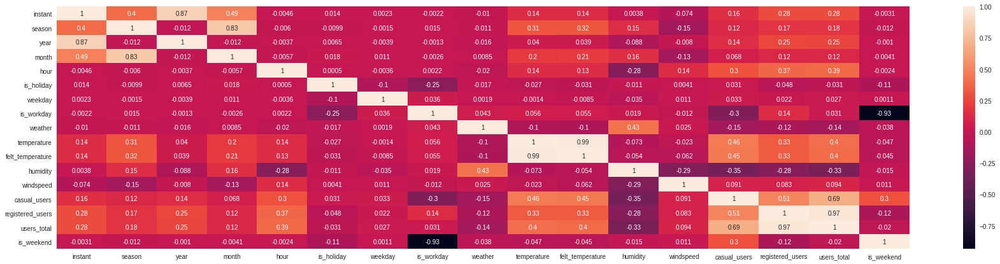

In [87]:
corr_mat_h = hdf.corr()
plt.figure(figsize=(30,7))
sns.heatmap(corr_mat_h, annot = True)
#plt.savefig("correlation.png")
plt.show()

In [174]:
hdf_outl = hdf[np.abs(hdf["windspeed"]-hdf["windspeed"].mean()) <= 3*hdf["windspeed"].std()]

In [175]:
hdf_outl2 = hdf_outl[np.abs(hdf_outl["users_total"]-hdf_outl["users_total"].mean()) <= 3*hdf_outl["users_total"].std()]

/home/karsten/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



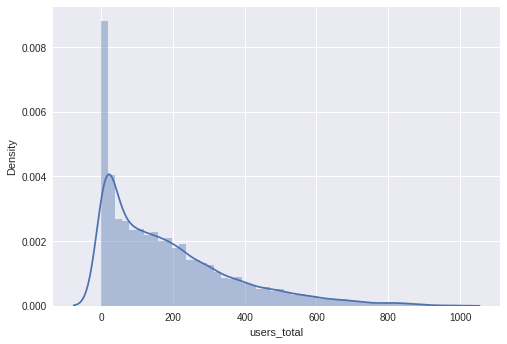

In [133]:
sns.distplot(hdf.users_total); 

/home/karsten/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



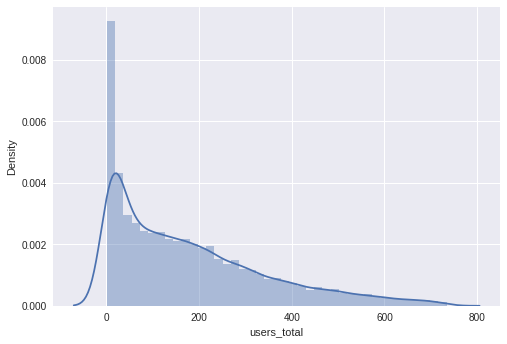

In [134]:
sns.distplot(hdf_outl2.users_total);

[-0.71686538 -0.30102791 -0.19960238 -0.25138311 -0.34210329 -0.26960742
 -0.22226253 -0.15836259 -0.20136714 -0.38461513]
Mean score is -0.30471968781970404
Standard deviation is 0.1522127322570649
[ 82.65666667  56.92714286  29.54178571  17.65         7.8575
   6.35916667  14.88        33.22040476 114.17833333 117.99666667]


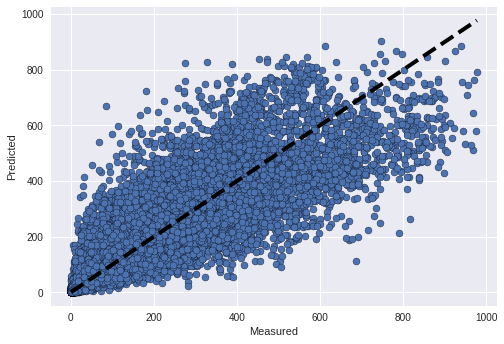

In [142]:
# Select features 
hdf_sel = hdf[['hour','is_holiday','is_workday','is_weekend','felt_temperature','humidity','users_total']]
#hdf_sel = hdf[['season','year','month','hour','is_holiday','weekday','is_workday','is_weekend','weather','temperature','felt_temperature','windspeed','users_total']]
X = hdf_sel.drop(columns = ['users_total'])
y = hdf_sel['users_total']
#y = hdf_sel.users_total.values.reshape(-1,1)
#### split the dataset into train and test sets
###X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
## one-hot encode input variables
#onehot_encoder = OneHotEncoder()
#onehot_encoder.fit(X_train)
#X_train = pd.get_dummies(X_train)
#X_test = pd.get_dummies(X_test)

# No categorial data in this set
#X = pd.get_dummies(X)
##y = pd.get_dummies(y)
##y_test = pd.get_dummies(y_test)
# define the model
model = RandomForestRegressor(max_features= 'auto', n_estimators= 100, n_jobs= -1)
###We do not need to call the fit method separately while using cross validation, the cross_val_score method fits the data itself while implementing the cross-validation on data.
# fit on the training set
#model.fit(X_train, y_train)
## predict on test set
#yhat = model.predict(X_test)
prediction = cross_val_predict(model, X, y, cv=10)
score = cross_val_score(model, X, y, cv=10, scoring='neg_mean_squared_log_error')
#score = cross_val_score(model, X, y, cv=10, scoring='neg_root_mean_squared_error')
print(score)
print(f"Mean score is {score.mean()}")
print(f"Standard deviation is {score.std()}")
print(prediction[:10])

fig, ax = plt.subplots()
ax.scatter(y, prediction, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

fig = px.scatter(x=y, y=prediction, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y.min(), y0=y.min(),
    x1=y.max(), y1=y.max()
)
fig.show()

[-0.70904448 -0.29306349 -0.18986153 -0.234271   -0.32773165 -0.28146716
 -0.22930149 -0.15585821 -0.19829919 -0.3930983 ]
Mean score is -0.30119965057190745
Standard deviation is 0.15155853299630634
[ 82.695       60.38357143  32.9375      18.03         7.50166667
   7.05266667  14.45        30.0832381  111.74       119.80857143]


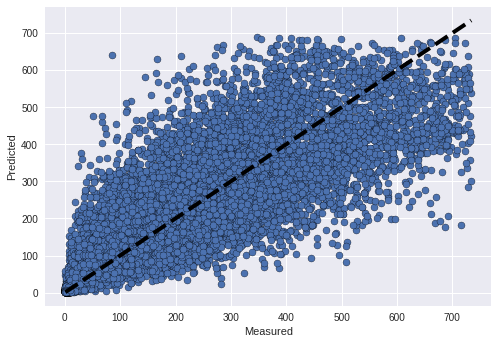

In [143]:
#hdf_sel = hdf_outl2[['weather','felt_temperature','humidity','users_total']]
#hdf_sel = hdf_outl2[['season','year','month','hour','is_holiday','weekday','is_workday','is_weekend','weather','temperature','felt_temperature','windspeed', 'humidity','users_total']]
hdf_sel = hdf_outl2[['hour','is_holiday','is_workday','is_weekend','felt_temperature','humidity','users_total']]
X = hdf_sel.drop(columns = ['users_total'])
y = hdf_sel['users_total']
# define the model
model = RandomForestRegressor(max_features= 'auto', n_estimators= 100, n_jobs= -1)
prediction = cross_val_predict(model, X, y, cv=10)
score = cross_val_score(model, X, y, cv=10, scoring='neg_mean_squared_log_error')
#score = cross_val_score(model, X, y, cv=10, scoring='neg_root_mean_squared_error')
print(score)
print(f"Mean score is {score.mean()}")
print(f"Standard deviation is {score.std()}")
print(prediction[:10])

fig, ax = plt.subplots()
ax.scatter(y, prediction, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

/home/karsten/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


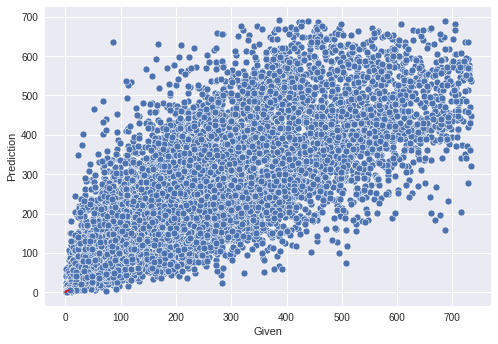

In [76]:
plot_k = sns.scatterplot(y, score)
plot_k.set(xlabel='Given', ylabel='Prediction')
# generate and graph y = x line
x_plot = np.linspace(0,5,100)
y_plot = x_plot
plt.plot(x_plot, y_plot, color='r');

0.44758578152502776


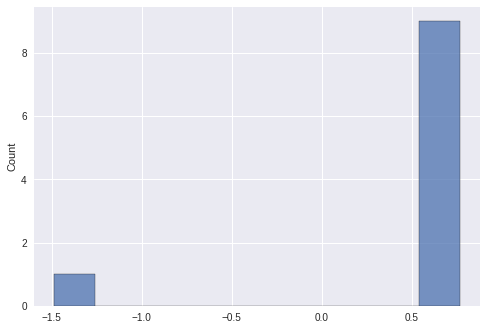

In [49]:
# find the mean score from the k-fold models usinf cross_val_score
#kfold_scores = cross_val_score(model, X, y, cv=10, scoring='neg_mean_squared_error')
kfold_scores = cross_val_score(model, X, y, cv=10)
print(kfold_scores.mean())
# plot scores
sns.histplot(kfold_scores, bins=10);

In [176]:
hdf_vis = hdf_outl2.copy()

hdf_vis['season'] = hdf_vis['season'].replace([1, 2, 3, 4], ['winter', 'spring', 'summer', 'fall'])
hdf_vis['year'] = hdf_vis['year'].replace([0, 1], [2011, 2012])
hdf_vis['weekday'] = hdf_vis['weekday'].replace([0, 1, 2, 3, 4, 5, 6], ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
hdf_vis['month'] = hdf_vis['month'].replace([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
hdf_vis['weather'] = hdf_vis['weather'].replace([1, 2, 3, 4], ['A', 'B', 'C', 'D'])
hdf_vis['is_holiday'] = hdf_vis['is_holiday'].replace([1, 0], ['yes', 'no'])
hdf_vis['is_workday'] = hdf_vis['is_workday'].replace([1, 0], ['yes', 'no'])
hdf_vis['is_weekend'] = hdf_vis['is_weekend'].replace([1, 0], ['yes', 'no'])
hdf_vis.weekday = hdf_vis.weekday.astype('category')
hdf_vis.is_holiday = hdf_vis.is_holiday.astype('category')
hdf_vis.is_weekend = hdf_vis.is_weekend.astype('category')

In [177]:
hdf_vis.dtypes

instant                      int64
date                datetime64[ns]
season                      object
year                         int64
month                       object
hour                         int64
is_holiday                category
weekday                   category
is_workday                  object
weather                     object
temperature                float64
felt_temperature           float64
humidity                   float64
windspeed                  float64
casual_users                 int64
registered_users             int64
users_total                  int64
is_weekend                category
dtype: object

[-2.19449782 -1.06452001 -0.72173067 -0.77645163 -1.25839187 -1.02848646
 -0.62317257 -0.35695803 -0.43980979 -0.76759024]
Mean RMSLE score is -0.9231609104661398
Standard deviation is 0.4990250694749127
[-170.89198661 -119.36910735 -132.64275927 -127.72410881 -107.91520135
  -91.75639588 -115.277806   -125.42468666 -119.50230433 -124.65713267]
Mean RMSE score is -123.51614889210302
Standard deviation is 19.244913546772633


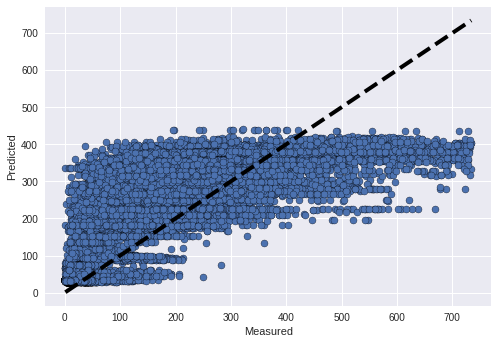

In [251]:
from sklearn.neighbors import KNeighborsRegressor
# With preprocessing and outliers removed
hdf_sel2 = hdf_vis[['hour','is_holiday', 'weekday','is_weekend','humidity','felt_temperature','users_total']]
X = hdf_sel2.drop(columns = ['users_total'])
y = hdf_sel2['users_total']
X = pd.get_dummies(X)
# define the model
# For RF: Use max_depth=3 as an initial tree depth to get a feel for how the tree is fitting to your data, and then increase the depth.
# min_samples_leaf guarantees that each leaf has a minimum size, avoiding low-variance, over-fit leaf nodes
# A very small number will usually mean the tree will overfit, whereas a large number will prevent the tree from learning the data.
# Try min_samples_leaf=5 as an initial value.
# max_depth=6,min_samples_leaf=8,

#model = KNeighborsRegressor()
model = AdaBoostRegressor(n_estimators=100)
#model = SVR(C=100, gamma=10) # with scoring='neg_mean_squared_log_error' gives error. See below.

#model = RandomForestRegressor(max_features= 'auto', n_estimators= 200, max_depth=6,min_samples_leaf=16, n_jobs= -1, random_state=42)
prediction = cross_val_predict(model, X, y, cv=10)
score = cross_val_score(model, X, y, cv=10, scoring='neg_mean_squared_log_error')
score_2 = cross_val_score(model, X, y, cv=10, scoring='neg_root_mean_squared_error')

print(score)
print(f"Mean RMSLE score is {score.mean()}")
print(f"Standard deviation is {score.std()}")
#print(prediction[:10])
print(score_2)
print(f"Mean RMSE score is {score_2.mean()}")
print(f"Standard deviation is {score_2.std()}")

fig, ax = plt.subplots()
ax.scatter(y, prediction, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

In [248]:
#from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

param_grid = {'max_depth': [3, 5, 10],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [5, 10, 15, 20]}
base_estimator = RandomForestRegressor(random_state=0)
sh = HalvingGridSearchCV(base_estimator, param_grid, cv=10,
                         factor=2, resource='n_estimators',
                         max_resources=30).fit(X, y)
sh.best_estimator_

ImportError: cannot import name 'HalvingGridSearchCV' from 'sklearn.model_selection' (/home/karsten/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/__init__.py)

In [223]:
def scores(X, y, split, metric_lst, estimator=model):
    '''Takes features and target sets, a list of metrics and an estimator -> 
    returns the scores of the metrics in the list '''
    # Fit and score the model with cross-validation
    for metric_desc, metric_name in metric_lst:
        score= cross_val_score(estimator, X, y, cv=split, scoring=metric_name)
        if metric_name=="neg_mean_squared_error":
            print(f"MSE values:{np.sqrt(-score)}", "\n")
            
        elif metric_name=="r2":
            print(f"{metric_desc} values:{score}", "\n")
            
        else:
            print(f"{metric_desc} values:{-score}")
            print(f"Mean score is {score.mean()}")

In [224]:
# Create a metric list
metrics_lst=[("MAE", "neg_mean_absolute_error"), 
             ("MSE", "neg_mean_squared_error"), 
             ("R^2", "r2"),
             ("RMSE", "neg_root_mean_squared_error"), 
             ("RMSLE", "neg_mean_squared_log_error")]

In [225]:
from sklearn.model_selection import TimeSeriesSplit
time_split = TimeSeriesSplit(n_splits=10)

In [228]:
#scores(X, y, time_split, metrics_lst, estimator=model)
scores(X, y, 10, metrics_lst, estimator=model)

MAE values:[63.14970735 60.0214036  55.60480483 59.32817298 53.49199783 74.2168516
 91.10712517 79.37860319 83.19628256 84.77788343]
Mean score is -70.42728325286649
MSE values:[103.10561518  88.37083721  79.79883354  91.01186239  84.41452939
 121.41622922 138.75616807 120.72518846 122.62460562 135.25322048] 

R^2 values:[0.27579761 0.66738593 0.70024479 0.5690191  0.44504542 0.47348954
 0.52758041 0.598817   0.61612604 0.40776895] 

RMSE values:[103.10561518  88.37083721  79.79883354  91.01186239  84.41452939
 121.41622922 138.75616807 120.72518846 122.62460562 135.25322048]
Mean score is -108.54770895597444
RMSLE values:[0.46856519 0.42015922 0.41198211 0.3456489  0.4707094  0.42350652
 0.34373716 0.26454979 0.27097233 0.47526139]
Mean score is -0.38950919994299793


In [255]:
#algorithm = KNeighborsRegressor()
#algorithm = SVR() # with scoring='neg_mean_squared_log_error': ValueError: Mean Squared Logarithmic Error cannot be used when targets contain negative values
#algorithm = AdaBoostRegressor()
algorithm = RandomForestRegressor()
seed = 13
#kfold = KFold(n_splits=3, shuffle=True, random_state=seed)
#hp_candidates = [{'n_neighbors': [2,3,4,5,6], 'weights': ['uniform','distance']}]
#hp_candidates = [{'C': [0.001, 0.01, 0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1, 10, 100]}]
hp_candidates = [{'n_estimators': [50, 100, 150, 200], 'max_features': ['auto', 'sqrt', 'log2'], 'bootstrap': [True, False], 'max_depth': [4,5,6,7], 'min_samples_leaf': [10,15,20], 'random_state' : [43]}]
grid = GridSearchCV(estimator=algorithm, param_grid=hp_candidates, cv=10, n_jobs= -1, scoring='neg_mean_squared_log_error')
grid.fit(X, y)

GridSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'bootstrap': [True, False], 'max_depth': [4, 5, 6, 7],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'min_samples_leaf': [10, 15, 20],
                          'n_estimators': [50, 100, 150, 200],
                          'random_state': [43]}],
             scoring='neg_mean_squared_log_error')

In [256]:
# Get the results
print(grid.best_score_)
print(grid.best_estimator_)
print(grid.best_params_)

-0.3265889374769508
RandomForestRegressor(max_depth=7, min_samples_leaf=15, n_estimators=200,
                      random_state=43)
{'bootstrap': True, 'max_depth': 7, 'max_features': 'auto', 'min_samples_leaf': 15, 'n_estimators': 200, 'random_state': 43}


In [191]:
#importances = pd.Series(data=model.feature_importances_ , index= X.columns)
#importance_sorted=importances.sort_values()
#importance_sorted.plot(kind="barh", color="blue");

NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [156]:
# With preprocessing and outliers kept
hdf_vis2 = hdf.copy()

hdf_vis2['season'] = hdf_vis2['season'].replace([1, 2, 3, 4], ['winter', 'spring', 'summer', 'fall'])
hdf_vis2['year'] = hdf_vis2['year'].replace([0, 1], [2011, 2012])
hdf_vis2['weekday'] = hdf_vis2['weekday'].replace([0, 1, 2, 3, 4, 5, 6], ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
hdf_vis2['month'] = hdf_vis2['month'].replace([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
hdf_vis2['weather'] = hdf_vis2['weather'].replace([1, 2, 3, 4], ['A', 'B', 'C', 'D'])
hdf_vis2['is_holiday'] = hdf_vis2['is_holiday'].replace([1, 0], ['yes', 'no'])
hdf_vis2['is_workday'] = hdf_vis2['is_workday'].replace([1, 0], ['yes', 'no'])
hdf_vis2['is_weekend'] = hdf_vis2['is_weekend'].replace([1, 0], ['yes', 'no'])
#hdf.season = hdf.season.astype('category')
#hdf.month = hdf.month.astype('category')
hdf_vis2.weekday = hdf_vis2.weekday.astype('category')
hdf_vis2.is_holiday = hdf_vis2.is_holiday.astype('category')
hdf_vis2.is_weekend = hdf_vis2.is_weekend.astype('category')

[-1.46197555 -0.35879438 -0.1781036  -0.23314089 -0.45367231 -0.33822218
 -0.29619444 -0.35026119 -0.31010546 -0.41219967]
Mean score is -0.4392669675436574
Standard deviation is 0.3491887203798404
[ 77.77891667  73.99679762  55.97826082  14.95133333   5.53591631
   5.18681885  32.04517857  36.09382784  88.10380952 137.284     ]


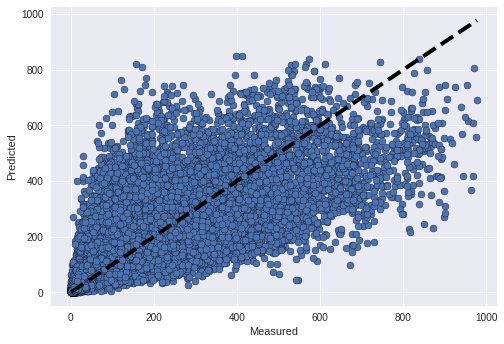

In [161]:
hdf_sel3 = hdf_vis2[['hour','is_holiday', 'weekday','is_weekend','humidity','users_total']]
#hdf_sel3 = hdf_vis2[['hour','is_holiday','is_workday','is_weekend','weekday','felt_temperature','humidity','weather','users_total']]
X = hdf_sel3.drop(columns = ['users_total'])
y = hdf_sel3['users_total']
X = pd.get_dummies(X)
# define the model
model = RandomForestRegressor(max_features= 'auto', n_estimators= 100, n_jobs= -1)
prediction = cross_val_predict(model, X, y, cv=10)
#score = cross_val_score(model, X, y, cv=10, scoring='explained_variance')
score = cross_val_score(model, X, y, cv=10, scoring='neg_mean_squared_log_error')
#score = cross_val_score(model, X, y, cv=10, scoring='neg_root_mean_squared_error')
print(score)
print(f"Mean score is {score.mean()}")
print(f"Standard deviation is {score.std()}")
print(prediction[:10])

fig, ax = plt.subplots()
ax.scatter(y, prediction, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

In [6]:
ddf = bikeday.rename(columns={'dteday': 'date', 'yr': 'year', 'mnth': 'month', 'hr': 'hour', 'workingday': 'is_workday', 'hum': 'humidity', 'cnt': 'users_total', 'holiday': 'is_holiday', 'atemp': 'felt_temperature', 'temp': 'temperature', 'weathersit': 'weather', 'casual': 'casual_users', 'registered': 'registered_users'})
ddf['season'] = ddf['season'].replace([1, 2, 3, 4], ['winter', 'spring', 'summer', 'fall'])
ddf['year'] = ddf['year'].replace([0, 1], [2011, 2012])
ddf['weekday'] = ddf['weekday'].replace([0, 1, 2, 3, 4, 5, 6], ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
ddf['month'] = ddf['month'].replace([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
#ddf['weather'] = hdf['weather'].replace([1, 2, 3, 4], ['A', 'B', 'C', 'D'])
ddf['is_holiday'] = hdf['is_holiday'].replace([1, 0], ['yes', 'no'])
ddf['is_workday'] = hdf['is_workday'].replace([1, 0], ['yes', 'no'])
ddf['date'] = ddf['date'].astype('datetime64')
ddf['is_weekend'] = np.where((ddf['weekday'] == 'Saturday') | (ddf['weekday'] == 'Sunday'), 'yes', 'no')
ddf.season = ddf.season.astype('category')
ddf.month = ddf.month.astype('category')
ddf.weekday = ddf.weekday.astype('category')